In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import glob
from os.path import join, basename
from skimage.util import img_as_ubyte
import skimage as ski
from skimage import filters
from skimage import exposure
import pandas as pd

In [8]:
# Your file paths
DATAROOT = r"E:\Documentos\01_DTU\DTU-TFM\Fotos\DOE\1\3 cropped"

image_files = sorted(glob.glob(join(DATAROOT, '*.jpg')))

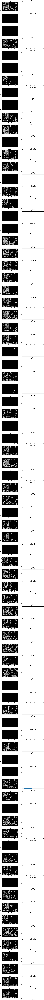

In [9]:
fig, axs = plt.subplots(len(image_files), 2, figsize=(15, 4 * len(image_files)))
t=120
# Create a CLAHE object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Create an empty DataFrame to store density results
density_data = {'Image': [], 'Density': []}

# Calculate the histograms and contrast metric, and populate the subplots
for i in range(len(image_files)):
    read_img = cv2.imread(image_files[i], 0)
    # Apply CLAHE to the image
    img = clahe.apply(read_img)

    # create a mask based on the threshold    
    thresh = (img < t).astype(np.uint8)
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    
    # Apply the binary mask to the original image
    result = cv2.bitwise_and(img, img, mask=thresh)

    # Calculate the contrast metric
    rootPixels = np.count_nonzero(thresh)
    w = thresh.shape[1]
    h = thresh.shape[0]
    density = round(rootPixels / (w * h), 3)  # Round to three decimals

    # Add results to the DataFrame
    density_data['Image'].append(basename(image_files[i]))
    density_data['Density'].append(density)

    # Display the image
    axs[i, 0].imshow(result, cmap='gray')
    axs[i, 0].set_title(f'{basename(image_files[i])}')

    # Display the histogram
    axs[i, 1].hist(result.ravel(), 256, [0, 256])
    axs[i, 1].set_title(f'Histogram {i+1}\nPercentage of white: {density}')
    axs[i, 1].set_xlabel('Intensity Value')
    axs[i, 1].set_ylabel('Count')
    axs[i, 1].set_xlim([0, 256])

# Save the DataFrame to a CSV file
density_df = pd.DataFrame(density_data)
density_df.to_csv('density_results_DOE3.csv', index=False)

plt.tight_layout()
plt.show()